# Levelling with equivalent sources
If we don't have crossing lines, and therfore don't have cross-over errors, we can instead use the data of nearby lines to level each line in a survey.

In [ ]:
# %load_ext autoreload
# %autoreload 2

import logging

import cmocean
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.io as pio
import verde as vd

import airbornegeo

mpl.rcParams["figure.dpi"] = 600

logging.getLogger("airbornegeo").setLevel("INFO")
logging.basicConfig()
pio.renderers.default = "notebook"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load data

This is a subset of the BAS AGAP survey over Antarctica's Gamburtsev Subglacial Mountains. The file is download and subset in the notebook `AGAP_magnetic_survey`, and the BAS processing steps are repeated in the notebook `processing_AGAP_magnetic_survey`.

In [237]:
data_df = pd.read_csv("data/AGAP_magnetic_survey_processed_blocked.csv")
data_df = data_df[
    [
        "easting",
        "northing",
        "height",
        "line",
        "distance_along_line",
        "mag",
        "unixtime",
    ]
]
data_df = data_df.rename(columns={"mag": "mag_unlevelled"})
data_df = data_df.dropna(subset=["mag_unlevelled"], how="any")

# pick a subset of lines
# data_df = data_df[data_df.line.between(100, 176)]
data_df = data_df[~data_df.line.isin(data_df[data_df.easting < 1.2e6].line.unique())]
data_df = data_df[data_df.line < 180]
data_df = data_df[~data_df.line.isin([146, 147])]
print(data_df.line.unique())

data_df

[ 90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 148 168 169 170 171 172 173 174 175 176]


,easting,northing,height,line,distance_along_line,mag_unlevelled,unixtime
374831,1.336534e+06,529778.046498,2764.45,90,159.896261,-0.090,1.230306e+09
374832,1.336618e+06,529823.042816,2764.30,90,255.576541,-0.060,1.230306e+09
374833,1.336703e+06,529866.938011,2763.90,90,351.236538,-0.045,1.230306e+09
374834,1.336788e+06,529909.930469,2763.00,90,446.699596,-0.030,1.230306e+09
374835,1.336874e+06,529952.010537,2761.70,90,542.345337,-0.020,1.230306e+09
...,...,...,...,...,...,...,...
613340,1.591561e+06,476313.424084,2162.55,176,122845.582468,17.950,1.230382e+09
613341,1.591579e+06,476208.077199,2162.85,176,122952.461240,12.380,1.230382e+09
613342,1.591596e+06,476102.436865,2163.35,176,123059.499898,7.075,1.230382e+09
613343,1.591613e+06,475996.711576,2164.30,176,123166.489557,1.865,1.230382e+09


In [238]:
data_df = airbornegeo.block_reduce(
    data_df,
    np.median,
    reduce_by="distance_along_line",
    spacing=200,
    groupby_column="line",
)

# define flight lines vs tie lines
data_df["line_type"] = np.where(data_df.line >= 142, "tie", "line")

data_df

Segments:   0%|          | 0/53 [00:00<?, ?it/s]

Segments: 100%|██████████| 53/53 [00:10<00:00,  5.14it/s]


,distance_along_line,easting,northing,height,mag_unlevelled,unixtime,line,line_type
0,255.576541,1.336618e+06,529823.042816,2764.300,-0.0600,1.230306e+09,90,line
1,494.522467,1.336831e+06,529930.970503,2762.350,-0.0250,1.230306e+09,90,line
2,685.921570,1.337004e+06,530013.356864,2759.325,-0.0200,1.230306e+09,90,line
3,909.854589,1.337209e+06,530104.600997,2755.650,-0.0025,1.230306e+09,90,line
4,1101.972160,1.337386e+06,530178.405637,2753.750,0.0825,1.230306e+09,90,line
...,...,...,...,...,...,...,...,...
68327,122418.895170,1.591483e+06,476732.899196,2159.350,42.5025,1.230382e+09,176,tie
68328,122592.209213,1.591515e+06,476562.587607,2161.175,32.3875,1.230382e+09,176,tie
68329,122792.211759,1.591552e+06,476365.948770,2162.300,20.8925,1.230382e+09,176,tie
68330,123005.980569,1.591588e+06,476155.257032,2163.100,9.7275,1.230382e+09,176,tie


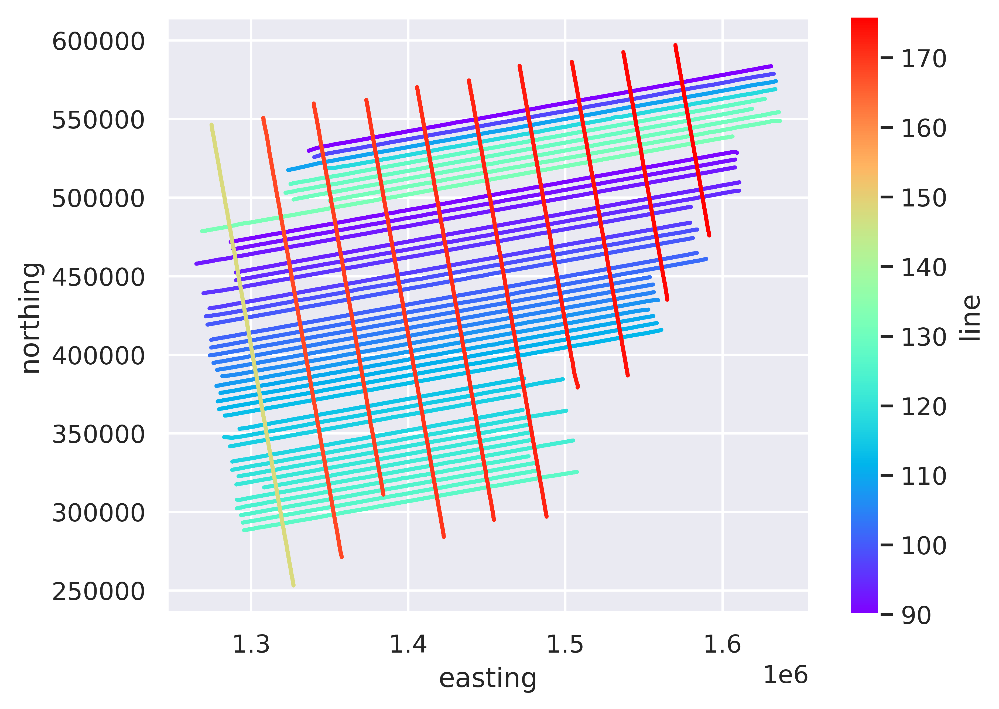

In [239]:
ax = data_df.plot.scatter(
    # ax = data_df[::20].plot.scatter(
    "easting",
    "northing",
    c="line",
    s=0.6,
    cmap="rainbow",
)
ax.set_aspect("equal")

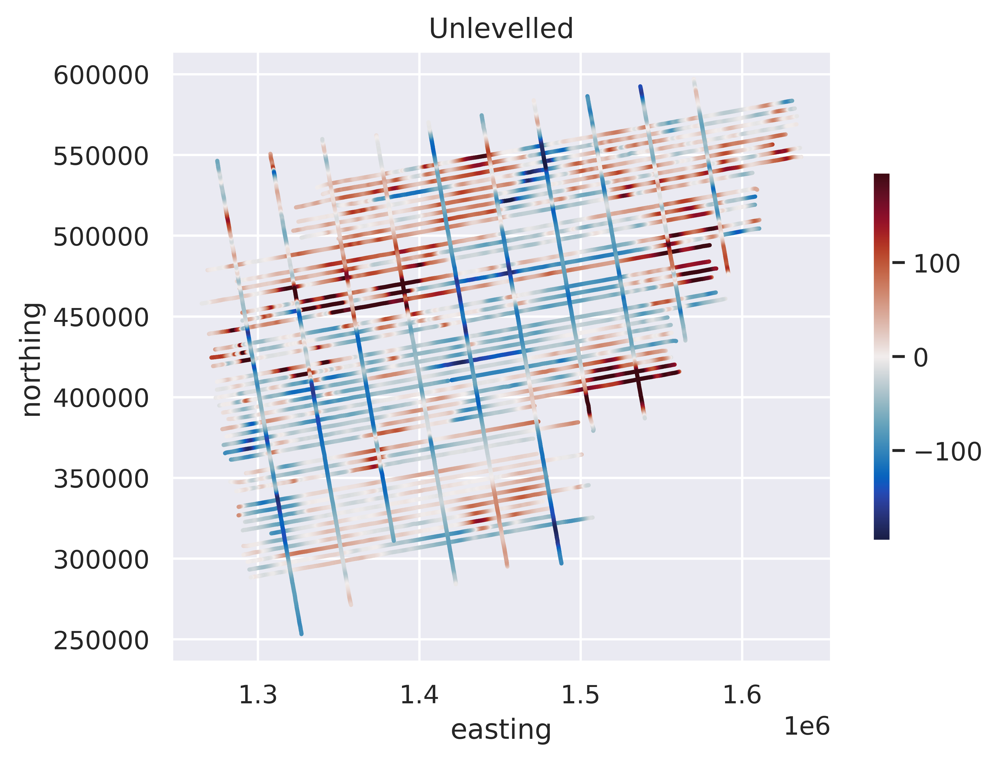

In [240]:
max_abs = vd.maxabs(data_df.mag_unlevelled, percentile=98)

ax = data_df.plot.scatter(
    "easting",
    "northing",
    c="mag_unlevelled",
    s=0.6,
    cmap=cmocean.cm.balance,
    vmin=-max_abs,
    vmax=max_abs,
    colorbar=False,
    title="Unlevelled",
)
ax.set_aspect("equal")
plt.colorbar(ax.collections[0], ax=ax, shrink=0.6)
plt.show()

## Perform iterative equivalent source levelling

This function will go through each line and perform the following steps:
1) find the data within `max_dist` of the line data (exluding the line data itself)
2) fit equivalent sources to this nearby data (with the provided `damping`, `depth`, and `block_size` parameters)
3) predict the forward effect of these equivalent sources onto the line
4) compute a misfit between the observed and predicted values
5) fit a trend ff the specified `degree` (0 for DC-shift, 1 for tilt, 2 for curve etc.)
6) add this trend to the observed line data.  

This results in a levelled line. The algorithm then processed to the next line. The order it goes through the lines is randomized, as set by the `seed` parameter for reproducibility. by default, all lines with be levelled. If you only want to level a subset of lines, you can pass a list of line names to parameter `lines_to_level`. Once all (or subset of) lines are levelled, this concludes the first iteration. The entire processed can be repeated by setting parameter `max_iterations` to greater than 1. 

The iterations will terminate on one of 4 stopping criteria:
1) the `max_iterations` is reached
2) the root mean square (RMS) of the levelling correction values for the iteration is below the set `rms_tolerance`
3) the RMS of the levelling correction values has increased more than the set `rms_percent_increase_tolerance` relative to the minimum RMS value for past iterations; this helps to stop run-away iterations
4) the RMS of the levelling correction values has not changed by more than the set `rms_percent_change_tolerance` between 2 subsequent iterations; this help save time by ending iterations when they aren't offering much improvement.

Iteration: 1:   0%|          | 0/20 [00:00<?, ?it/s]

Iteration: 12:  55%|█████▌    | 11/20 [02:57<02:33, 17.08s/it]INFO:airbornegeo:
Levelling terminated after 12 iterations because there was no significant variation in the RMS (delta RMS of -12.2%) of the levelling corrections over 2 iterations 
Change parameter 'rms_percent_change_tolerance' (2%) if desired.
Iterations ended due to ['RMS percent change tolerance']:  55%|█████▌    | 11/20 [03:13<02:38, 17.64s/it]


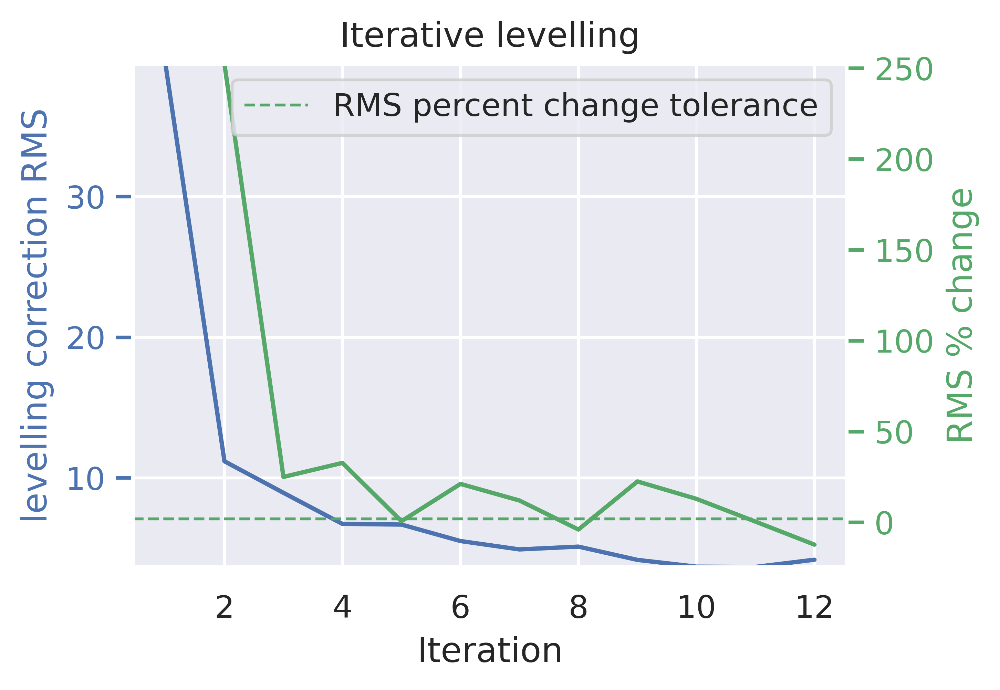

,distance_along_line,easting,northing,height,mag_unlevelled,unixtime,line,line_type,mag_levelled
0,255.576541,1.336618e+06,529823.042816,2764.300,-0.0600,1.230306e+09,90,line,34.437376
1,494.522467,1.336831e+06,529930.970503,2762.350,-0.0250,1.230306e+09,90,line,34.436822
2,685.921570,1.337004e+06,530013.356864,2759.325,-0.0200,1.230306e+09,90,line,34.413342
3,909.854589,1.337209e+06,530104.600997,2755.650,-0.0025,1.230306e+09,90,line,34.397521
4,1101.972160,1.337386e+06,530178.405637,2753.750,0.0825,1.230306e+09,90,line,34.453935


In [241]:
data_df["mag_levelled"] = airbornegeo.equivalent_source_levelling(
    data_df,
    data_column="mag_unlevelled",
    distance_column="distance_along_line",
    degree=1,
    max_dist=60e3,
    damping=None,
    depth="default",
    # data_block_size=5e3,
    source_block_size=20e3,
    max_iterations=20,
    rms_percent_change_tolerance=2,
)
data_df.head()

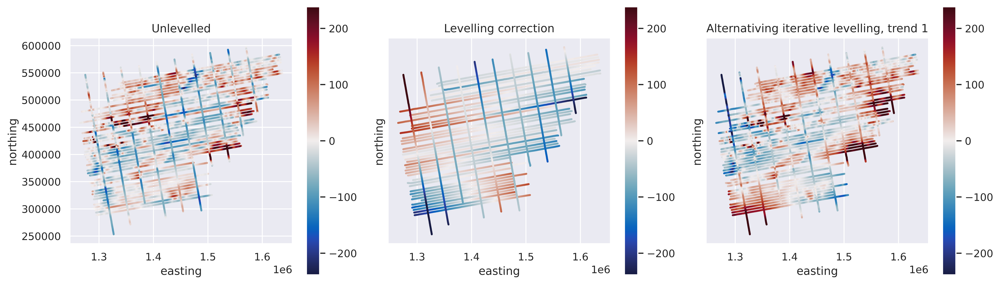

In [243]:
fig, axs = plt.subplots(1, 3, figsize=(15, 40))

data_df["levelling_correction"] = data_df.mag_unlevelled - data_df.mag_levelled

df = data_df

max_abs = vd.maxabs(data_df.mag_unlevelled, data_df.mag_levelled, percentile=98)
ax = df.plot.scatter(
    "easting",
    "northing",
    c="mag_unlevelled",
    s=1,
    ax=axs[0],
    cmap=cmocean.cm.balance,
    vmin=-max_abs,
    vmax=max_abs,
    colorbar=False,
    title="Unlevelled",
)
ax.set_aspect("equal")
plt.colorbar(ax.collections[0], ax=ax, shrink=0.1)

ax = df.plot.scatter(
    "easting",
    "northing",
    c="levelling_correction",
    s=1,
    ax=axs[1],
    cmap=cmocean.cm.balance,
    vmin=-max_abs,
    vmax=max_abs,
    colorbar=False,
    title="Levelling correction",
)
ax.set_yticks([])
ax.set_aspect("equal")
plt.colorbar(ax.collections[0], ax=ax, shrink=0.1)

ax = df.plot.scatter(
    "easting",
    "northing",
    c="mag_levelled",
    s=1,
    ax=axs[2],
    cmap=cmocean.cm.balance,
    vmin=-max_abs,
    vmax=max_abs,
    colorbar=False,
    title="Alternativing iterative levelling, trend 1",
)
ax.set_yticks([])
ax.set_aspect("equal")
plt.colorbar(ax.collections[0], ax=ax, shrink=0.1)

plt.tight_layout()
plt.show()

## Analyze cross-over errors

In [244]:
import geopandas as gpd

# convert dataframe into geodataframe
data_df = gpd.GeoDataFrame(
    data_df,
    geometry=gpd.points_from_xy(data_df.easting, data_df.northing),
    crs="EPSG:3031",
)

In [245]:
# calculate theoretical intersection points
inters = airbornegeo.create_intersection_table(data_df, plot_map=False, plot_hist=False)

Potential intersections: 100%|██████████| 320/320 [00:01<00:00, 238.14it/s]
INFO:airbornegeo:found 318 intersections


In [ ]:
data_df_cross_overs, inters = airbornegeo.interpolate_intersections(
    data_df,
    inters,
    to_interp="mag_unlevelled",
    window_width=500,
    method="cubic",
    extrapolate=False,
)
inters = airbornegeo.calculate_crossover_errors(
    data_df_cross_overs,
    inters,
    data_col="mag_unlevelled",
    plot_map=False,
    plot_hist=False,
)

Segments: 100%|██████████| 53/53 [00:01<00:00, 29.46it/s]


In [249]:
data_df_cross_overs, inters = airbornegeo.interpolate_intersections(
    data_df_cross_overs,
    inters,
    to_interp="mag_levelled",
    window_width=500,
    method="cubic",
    extrapolate=False,
)
inters = airbornegeo.calculate_crossover_errors(
    data_df_cross_overs,
    inters,
    data_col="mag_levelled",
    plot_map=False,
    plot_hist=False,
)

Intersections: 100%|██████████| 318/318 [00:00<00:00, 715.33it/s]


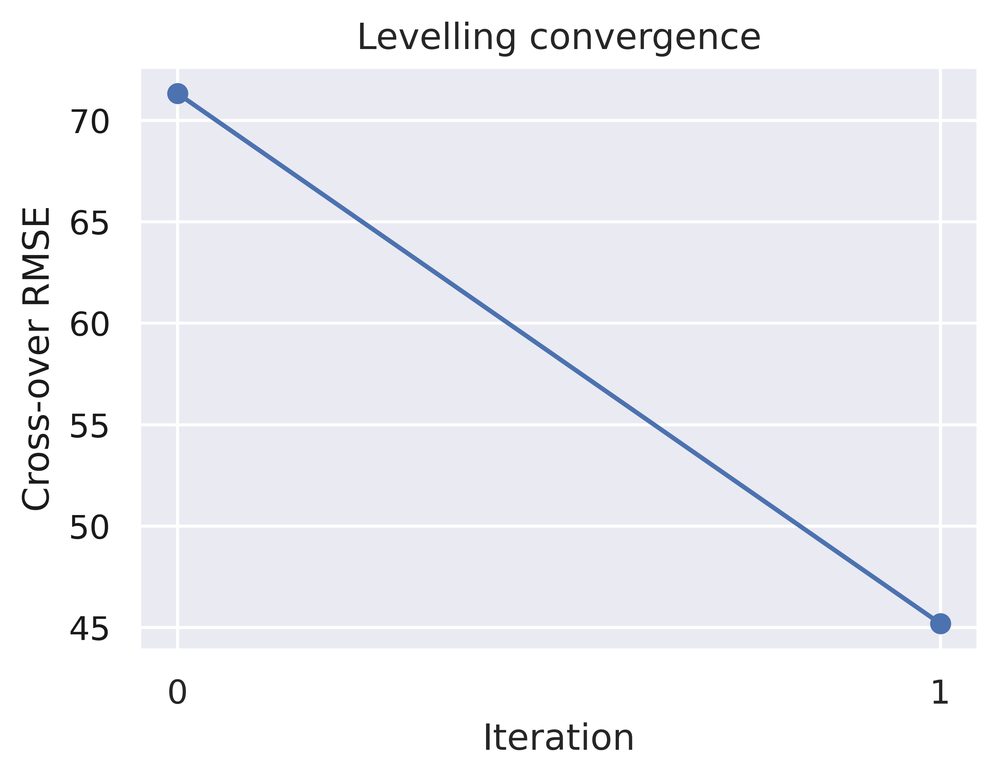

In [250]:
airbornegeo.plot_levelling_convergence(inters)

## Cross-over levelling

In [252]:
data_df_cross_over_levelling, inters = airbornegeo.interpolate_intersections(
    data_df,
    inters,
    to_interp="mag_unlevelled",
    window_width=500,
    method="cubic",
    extrapolate=False,
)
inters = airbornegeo.calculate_crossover_errors(
    data_df_cross_over_levelling,
    inters,
    data_col="mag_unlevelled",
    plot_map=False,
    plot_hist=False,
)

Intersections: 100%|██████████| 318/318 [00:00<00:00, 810.43it/s]


Iteration: 20:  95%|█████████▌| 19/20 [00:35<00:01,  1.85s/it]WARNING:airbornegeo:
Equivalent source levelling terminated after 20 iterations with RMS of levelling correction of 0.02 because maximum number of iterations (20) reached.
Iterations ended due to ['max iterations']:  95%|█████████▌| 19/20 [00:37<00:01,  1.95s/it]


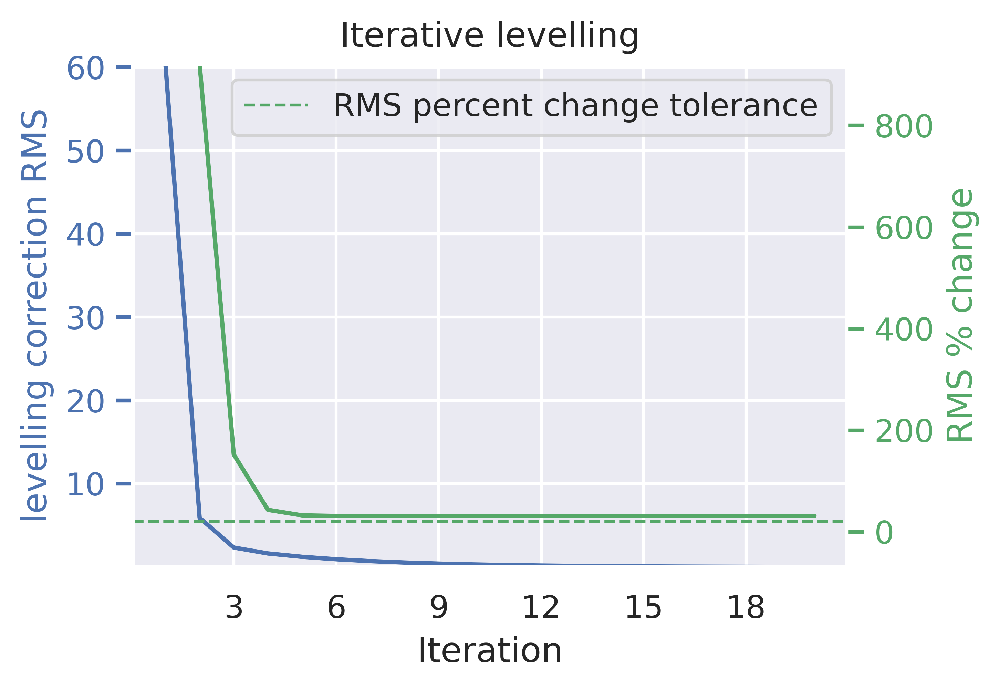

In [253]:
data_df_cross_over_levelling, inters_alternating = (
    airbornegeo.alternating_iterative_line_levelling(
        data_df_cross_over_levelling,
        inters,
        data_col="mag_unlevelled",
        levelled_col="mag_crossover_levelled",
        degree=1,
        max_iterations=20,
        rms_percent_change_tolerance=20,
    )
)

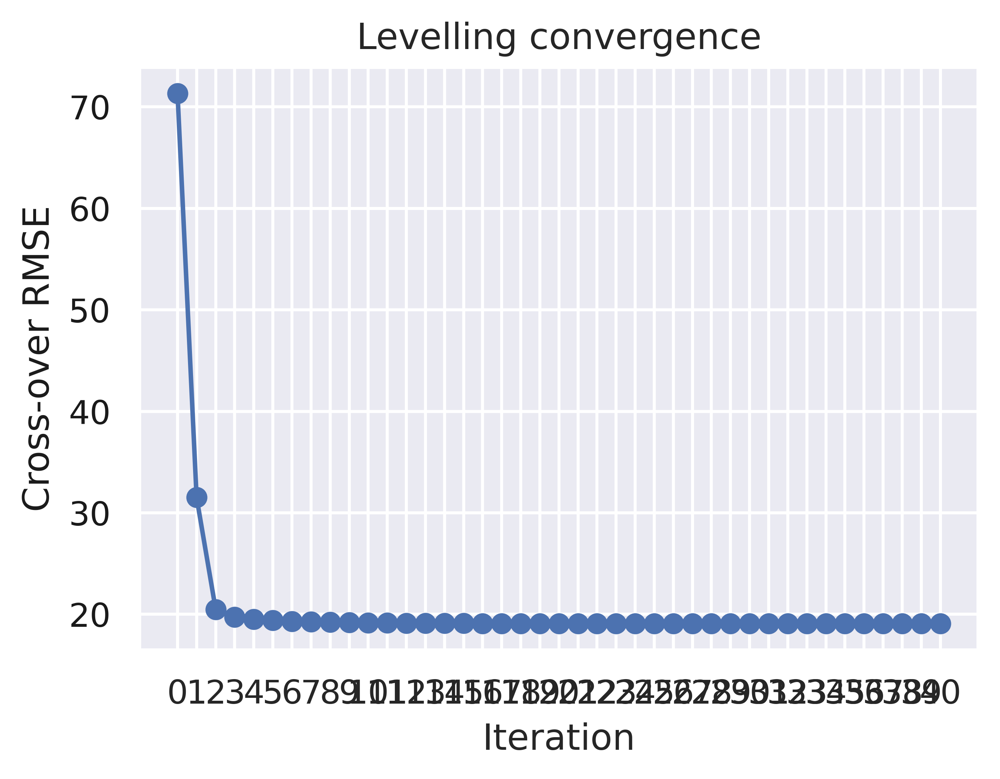

In [234]:
airbornegeo.plot_levelling_convergence(inters_alternating)

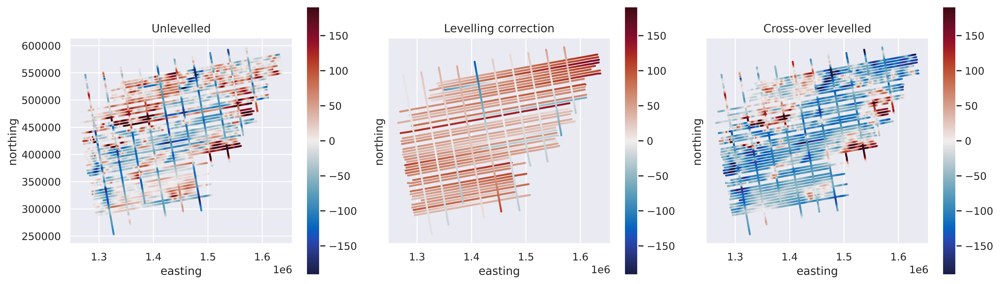

In [235]:
fig, axs = plt.subplots(1, 3, figsize=(15, 40))

data_df["levelling_correction"] = (
    data_df.mag_unlevelled - data_df.mag_crossover_levelled
)

df = data_df

max_abs = vd.maxabs(
    data_df.mag_unlevelled, data_df.mag_crossover_levelled, percentile=98
)
ax = df.plot.scatter(
    "easting",
    "northing",
    c="mag_unlevelled",
    s=1,
    ax=axs[0],
    cmap=cmocean.cm.balance,
    vmin=-max_abs,
    vmax=max_abs,
    colorbar=False,
    title="Unlevelled",
)
ax.set_aspect("equal")
plt.colorbar(ax.collections[0], ax=ax, shrink=0.1)

ax = df.plot.scatter(
    "easting",
    "northing",
    c="levelling_correction",
    s=1,
    ax=axs[1],
    cmap=cmocean.cm.balance,
    vmin=-max_abs,
    vmax=max_abs,
    colorbar=False,
    title="Levelling correction",
)
ax.set_yticks([])
ax.set_aspect("equal")
plt.colorbar(ax.collections[0], ax=ax, shrink=0.1)

ax = df.plot.scatter(
    "easting",
    "northing",
    c="mag_crossover_levelled",
    s=1,
    ax=axs[2],
    cmap=cmocean.cm.balance,
    vmin=-max_abs,
    vmax=max_abs,
    colorbar=False,
    title="Cross-over levelled",
)
ax.set_yticks([])
ax.set_aspect("equal")
plt.colorbar(ax.collections[0], ax=ax, shrink=0.1)

plt.tight_layout()
plt.show()

## Visualize the process

In [173]:
import harmonica as hm

line_name = 113
iteration = 1
data_column = "mag_unlevelled"
distance_column = "distance_along_line"
degree = 2
max_dist = 60e3
damping = None
depth = "default"
source_block_size = 20e3
data_block_size = None

data = data_df.copy()


line_df = data[data.line == line_name]
survey_df = data[data.line != line_name]

# subset data nearby
dist_mask = vd.distance_mask(
    (line_df.easting, line_df.northing),
    maxdist=max_dist,
    coordinates=(survey_df.easting, survey_df.northing),
)
nearby_survey_df = survey_df.iloc[dist_mask]

# if len(nearby_survey_df)==0:
# continue


# block reduce data used for fitting eq sources
if data_block_size is not None:
    nearby_survey_df = airbornegeo.block_reduce(
        nearby_survey_df,
        np.median,
        reduce_by=distance_column,
        spacing=data_block_size,
        groupby_column="line",
        progressbar=False,
    )

# fit eq sources to nearby data
coords = (
    nearby_survey_df.easting,
    nearby_survey_df.northing,
    nearby_survey_df.height,
)
# # if block-reducing for sources, do it manually so sources are along lines
# if source_block_size is not None:
#     blocked_nearby_survey = airbornegeo.block_reduce(
#         nearby_survey_df,
#         np.median,
#         spacing=source_block_size,
#         reduce_by=distance_column,
#         groupby_column='line',
#         progressbar=False,
#     )
#     blocked_nearby_survey = airbornegeo.block_reduce(
#         blocked_nearby_survey,
#         np.median,
#         spacing=source_block_size,
#         reduce_by=('easting','northing'),
#         progressbar=False,
#     )
#     if depth == "default":
#         source_depth = 4.5 * np.mean(
#         bd.neighbor_distance_statistics(
#             (blocked_nearby_survey.easting, blocked_nearby_survey.northing),
#             "median",
#             k=1,
#         )
#     )
#     else:
#         source_depth = depth
#     points = (
#         blocked_nearby_survey.easting,
#         blocked_nearby_survey.northing,
#         blocked_nearby_survey.height - source_depth,
#     )
# else:
#     points = None
points = None
eqs = hm.EquivalentSources(
    damping=damping,
    depth=depth,
    points=points,
    block_size=source_block_size,
)
eqs.fit(coords, nearby_survey_df[data_column])
points = eqs.points_

# predict eq sources on the line to be levelled
line_df["tmp_predicted_eqs"] = eqs.predict(
    (line_df.easting, line_df.northing, line_df.height)
)

line_df["tmp_misfit"] = line_df.tmp_predicted_eqs - line_df[data_column]

# calculate levelling correction with a trend fit to the misfit values
line_df = airbornegeo.levelling.skl_predict_trend(
    data_to_fit=line_df,
    cols_to_fit=["distance_along_line", "tmp_misfit"],
    data_to_predict=line_df,
    cols_to_predict=[
        "distance_along_line",
        f"tmp_levelling_correction_{iteration}",
    ],
    degree=degree,
)

# TODO: make levelling correction 0 if more than max_dist from other line data

# update the levelled line before moving on to the next line
data.loc[data.line == line_name, data_column] = (
    line_df[data_column] + line_df[f"tmp_levelling_correction_{iteration}"]
)
data.loc[data.line == line_name, f"tmp_levelling_correction_{iteration}"] = line_df[
    f"tmp_levelling_correction_{iteration}"
]

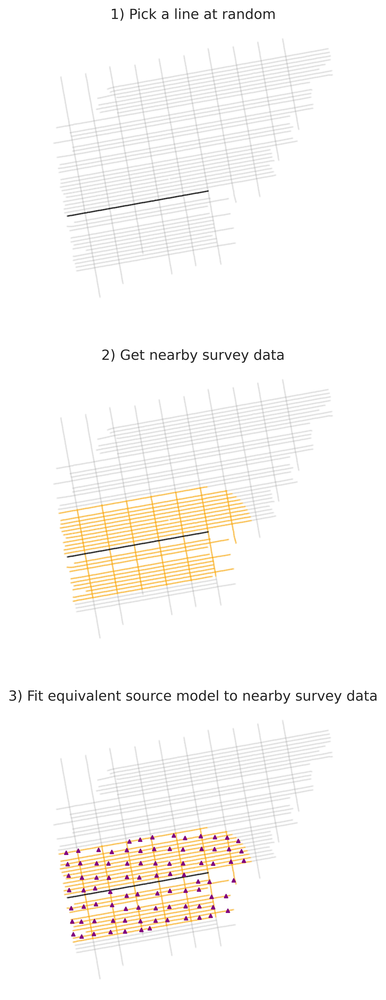

In [175]:
fig, axs = plt.subplots(3, 1, figsize=(15, 15))

# 1) randomly select a line
# plot entire survey
i = 0
axs[i].scatter(
    survey_df.easting,
    survey_df.northing,
    s=0.01,
    color="gray",
    marker=".",
    # alpha=.20,
)
# plot selected line
axs[i].scatter(
    line_df.easting,
    line_df.northing,
    s=0.2,
    c="black",
    marker=".",
)
axs[i].set_title("1) Pick a line at random")
axs[i].set_aspect("equal")
axs[i].set_axis_off()

# 2) get data within set distance of line data
# plot entire survey
i += 1
axs[i].scatter(
    survey_df.easting,
    survey_df.northing,
    s=0.01,
    color="gray",
    marker=".",
    # alpha=.20,
)
# plot nearby survey data
axs[i].scatter(
    nearby_survey_df.easting,
    nearby_survey_df.northing,
    s=0.1,
    color="orange",
    marker=".",
)
# plot selected line
axs[i].scatter(
    line_df.easting,
    line_df.northing,
    s=0.2,
    c="black",
    marker=".",
)
axs[i].set_title("2) Get nearby survey data")
axs[i].set_aspect("equal")
axs[i].set_axis_off()


# 3) fit eqs to nearby data
# plot entire survey
i += 1
axs[i].scatter(
    survey_df.easting,
    survey_df.northing,
    s=0.01,
    color="gray",
    marker=".",
    # alpha=.20,
)
# plot nearby survey data
axs[i].scatter(
    nearby_survey_df.easting,
    nearby_survey_df.northing,
    s=0.1,
    color="orange",
    marker=".",
    # alpha=.20,
)
# plot selected line
axs[i].scatter(
    line_df.easting,
    line_df.northing,
    s=0.2,
    c="black",
    marker=".",
    # alpha=.20,
)
# plot blocked equivalent sources
axs[i].scatter(
    points[0],
    points[1],
    s=8,
    c="purple",
    marker="^",
    # alpha=.20,
)
axs[i].set_title("3) Fit equivalent source model to nearby survey data")
axs[i].set_aspect("equal")
axs[i].set_axis_off()

plt.show()

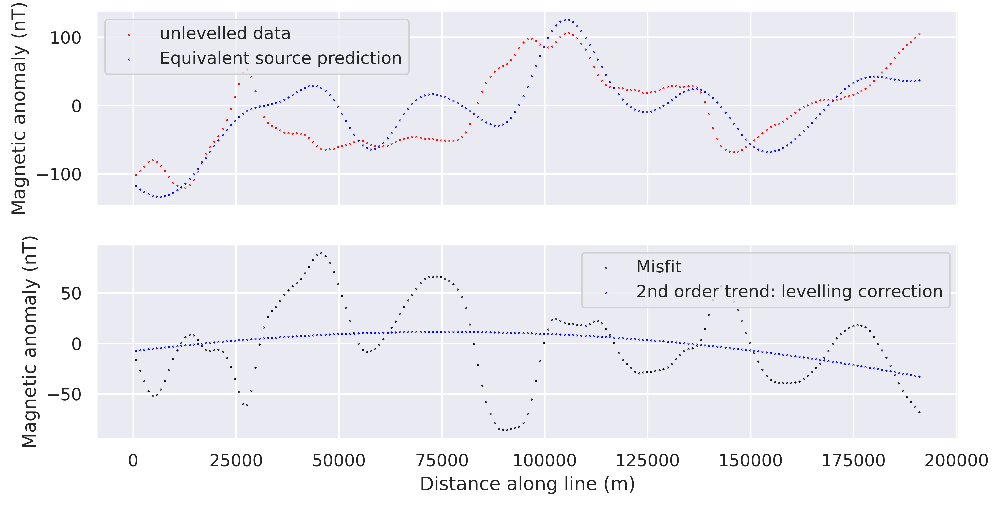

In [145]:
fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(10, 5), sharex=True)

# plot selected line
ax1.scatter(
    line_df.distance_along_line,
    line_df[data_column],
    s=0.5,
    c="red",
    marker=".",
    label="unlevelled data",
)
ax1.scatter(
    line_df.distance_along_line,
    line_df.tmp_predicted_eqs,
    s=0.5,
    c="blue",
    marker=".",
    label="Equivalent source prediction",
)
ax1.set_ylabel("Magnetic anomaly (nT)")

ax2.scatter(
    line_df.distance_along_line,
    line_df.tmp_misfit,
    s=0.5,
    c="black",
    marker=".",
    label="Misfit",
)
ax2.scatter(
    line_df.distance_along_line,
    line_df[f"tmp_levelling_correction_{iteration}"],
    s=0.5,
    c="blue",
    marker=".",
    label="2nd order trend: levelling correction",
)

ax2.set_xlabel("Distance along line (m)")
ax2.set_ylabel("Magnetic anomaly (nT)")
ax1.legend()
ax2.legend();